<a href="https://colab.research.google.com/github/HammadN98/Estudos-de-caso/blob/main/regressao_Estudo_de_caso.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Life Expectancy

**Objetivo:** Prever a expectativa de vida de países com base em indicadores sociais, econômicos e de saúde.

Dados obtidos em: [Life Expectancy](https://www.kaggle.com/datasets/lashagoch/life-expectancy-who-updated)

## 0. Importacoes

In [1]:
import pandas as pd
#import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
dados = pd.read_csv("https://raw.githubusercontent.com/HammadN98/Estudos-de-caso/refs/heads/main/Dados/Life-Expectancy-Data-Updated.csv")

## 1. Informacoes iniciais

In [3]:
dados.head()

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.8240,1.32,97,65,27.8,...,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5
1,Spain,European Union,2015,2.7,3.3,57.9025,10.35,97,94,26.0,...,97,0.09,25742,46.44,0.6,0.5,9.7,1,0,82.8
2,India,Asia,2007,51.5,67.9,201.0765,1.57,60,35,21.2,...,64,0.13,1076,1183.21,27.1,28.0,5.0,0,1,65.4
3,Guyana,South America,2006,32.8,40.5,222.1965,5.68,93,74,25.3,...,93,0.79,4146,0.75,5.7,5.5,7.9,0,1,67.0
4,Israel,Middle East,2012,3.4,4.3,57.9510,2.89,97,89,27.0,...,94,0.08,33995,7.91,1.2,1.1,12.8,1,0,81.7


In [4]:
todas_columns = dados.columns
todas_columns

Index(['Country', 'Region', 'Year', 'Infant_deaths', 'Under_five_deaths',
       'Adult_mortality', 'Alcohol_consumption', 'Hepatitis_B', 'Measles',
       'BMI', 'Polio', 'Diphtheria', 'Incidents_HIV', 'GDP_per_capita',
       'Population_mln', 'Thinness_ten_nineteen_years',
       'Thinness_five_nine_years', 'Schooling', 'Economy_status_Developed',
       'Economy_status_Developing', 'Life_expectancy'],
      dtype='object')

In [5]:
dados.info()
#Apriori sem valores null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2864 entries, 0 to 2863
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Country                      2864 non-null   object 
 1   Region                       2864 non-null   object 
 2   Year                         2864 non-null   int64  
 3   Infant_deaths                2864 non-null   float64
 4   Under_five_deaths            2864 non-null   float64
 5   Adult_mortality              2864 non-null   float64
 6   Alcohol_consumption          2864 non-null   float64
 7   Hepatitis_B                  2864 non-null   int64  
 8   Measles                      2864 non-null   int64  
 9   BMI                          2864 non-null   float64
 10  Polio                        2864 non-null   int64  
 11  Diphtheria                   2864 non-null   int64  
 12  Incidents_HIV                2864 non-null   float64
 13  GDP_per_capita    

In [6]:
dados.describe()

,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
count,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000
mean,2007.500000,30.363792,42.938268,192.251775,4.820882,84.292598,77.344972,25.032926,86.499651,86.271648,0.894288,11540.924930,36.675915,4.865852,4.899825,7.632123,0.206704,0.793296,68.856075
std,4.610577,27.538117,44.569974,114.910281,3.981949,15.995511,18.659693,2.193905,15.080365,15.534225,2.381389,16934.788931,136.485867,4.438234,4.525217,3.171556,0.405012,0.405012,9.405608
min,2000.000000,1.800000,2.300000,49.384000,0.000000,12.000000,10.000000,19.800000,8.000000,16.000000,0.010000,148.000000,0.080000,0.100000,0.100000,1.100000,0.000000,0.000000,39.400000
25%,2003.750000,8.100000,9.675000,106.910250,1.200000,78.000000,64.000000,23.200000,81.000000,81.000000,0.080000,1415.750000,2.097500,1.600000,1.600000,5.100000,0.000000,1.000000,62.700000
50%,2007.500000,19.600000,23.100000,163.841500,4.020000,89.000000,83.000000,25.500000,93.000000,93.000000,0.150000,4217.000000,7.850000,3.300000,3.400000,7.800000,0.000000,1.000000,71.400000
75%,2011.250000,47.350000,66.000000,246.791375,7.777500,96.000000,93.000000,26.400000,97.000000,97.000000,0.460000,12557.000000,23.687500,7.200000,7.300000,10.300000,0.000000,1.000000,75.400000
max,2015.000000,138.100000,224.900000,719.360500,17.870000,99.000000,99.000000,32.100000,99.000000,99.000000,21.680000,112418.000000,1379.860000,27.700000,28.600000,14.100000,1.000000,1.000000,83.800000


## 2. Tratamento dos dados

* Verificar a existencia de valores nulos e outliers

In [7]:
dados.isnull().sum().sum()

0

Nao existem valores nulos no dataset

In [8]:
print(dados.select_dtypes(include='object').columns)
cat_columns = dados.select_dtypes(include='object').columns
cat_columns

Index(['Country', 'Region'], dtype='object')


Index(['Country', 'Region'], dtype='object')

In [9]:
dados_categoricos = pd.get_dummies(dados[cat_columns], drop_first=True)

In [10]:
dados

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.8240,1.320,97,65,27.8,...,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5
1,Spain,European Union,2015,2.7,3.3,57.9025,10.350,97,94,26.0,...,97,0.09,25742,46.44,0.6,0.5,9.7,1,0,82.8
2,India,Asia,2007,51.5,67.9,201.0765,1.570,60,35,21.2,...,64,0.13,1076,1183.21,27.1,28.0,5.0,0,1,65.4
3,Guyana,South America,2006,32.8,40.5,222.1965,5.680,93,74,25.3,...,93,0.79,4146,0.75,5.7,5.5,7.9,0,1,67.0
4,Israel,Middle East,2012,3.4,4.3,57.9510,2.890,97,89,27.0,...,94,0.08,33995,7.91,1.2,1.1,12.8,1,0,81.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2859,Niger,Africa,2000,97.0,224.9,291.8240,0.092,72,64,20.8,...,34,0.49,399,11.33,12.8,12.9,1.1,0,1,49.9
2860,Mongolia,Asia,2009,23.9,28.6,235.2330,6.560,97,97,25.3,...,95,0.02,2515,2.67,2.2,2.3,9.1,0,1,66.9
2861,Sri Lanka,Asia,2004,17.7,28.9,134.8950,1.560,62,95,21.9,...,97,0.02,2130,19.39,15.4,15.5,10.3,0,1,74.3
2862,Lithuania,European Union,2002,7.9,9.9,204.0120,11.000,94,95,26.1,...,95,0.05,7424,3.44,3.3,3.3,11.1,1,0,71.8


In [11]:
num_columns = dados.select_dtypes(include=['int64', 'float64']).columns.tolist()
num_columns

['Year',
 'Infant_deaths',
 'Under_five_deaths',
 'Adult_mortality',
 'Alcohol_consumption',
 'Hepatitis_B',
 'Measles',
 'BMI',
 'Polio',
 'Diphtheria',
 'Incidents_HIV',
 'GDP_per_capita',
 'Population_mln',
 'Thinness_ten_nineteen_years',
 'Thinness_five_nine_years',
 'Schooling',
 'Economy_status_Developed',
 'Economy_status_Developing',
 'Life_expectancy']

### 2.1 Analisando a distribuicao dos dados por variavel

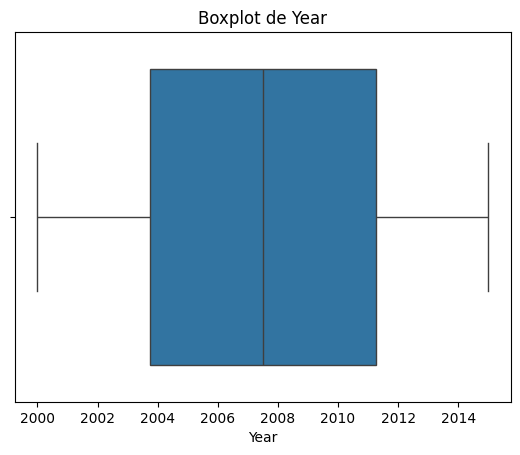

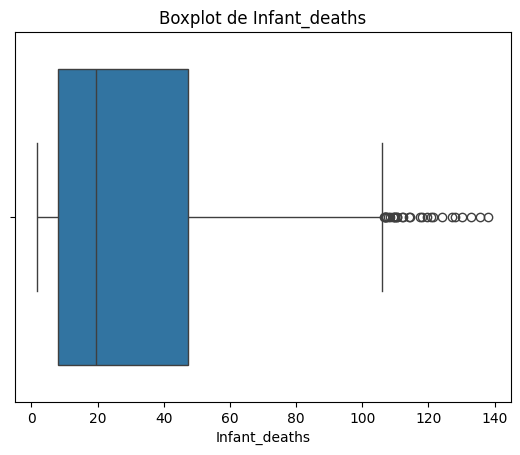

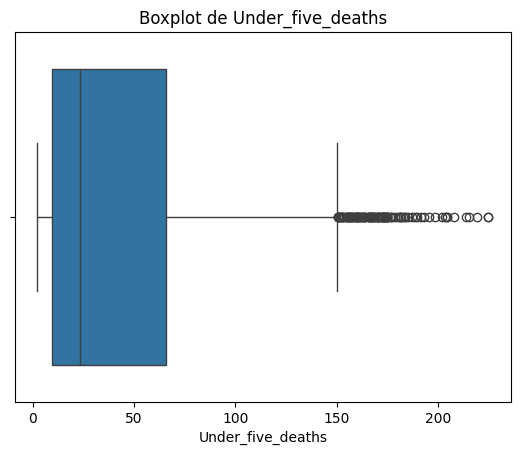

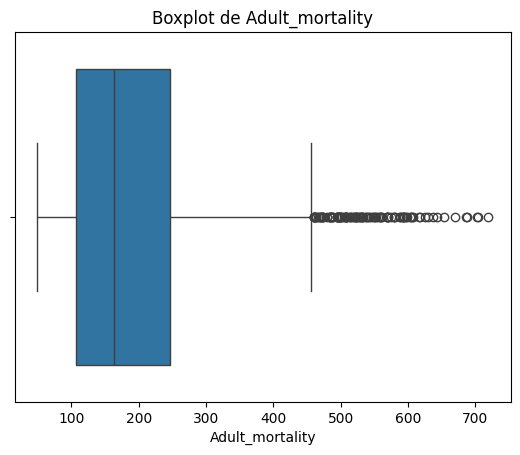

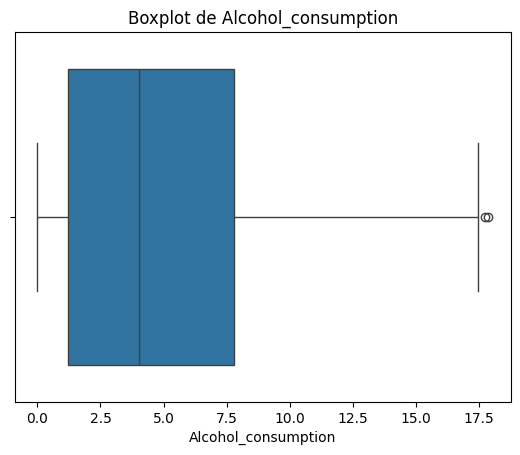

...

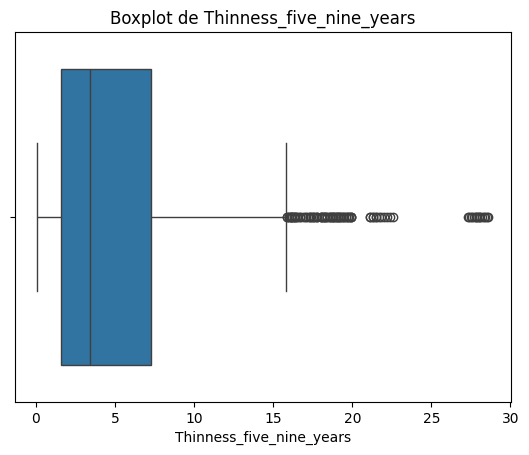

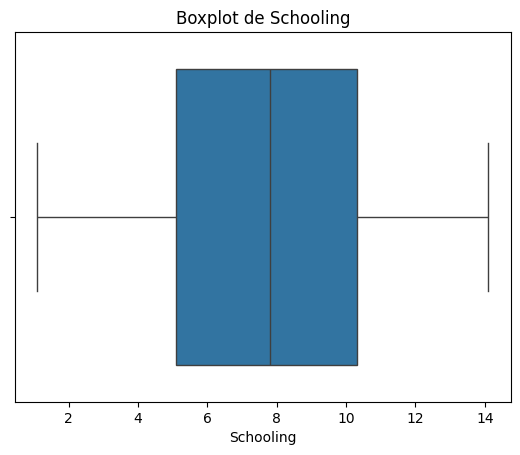

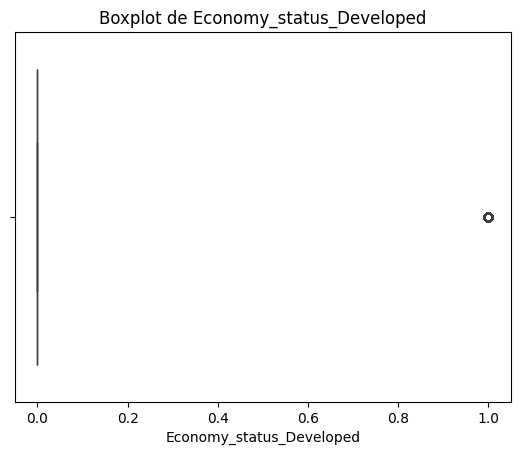

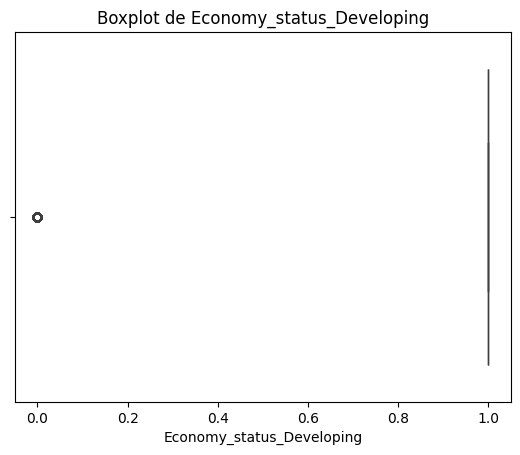

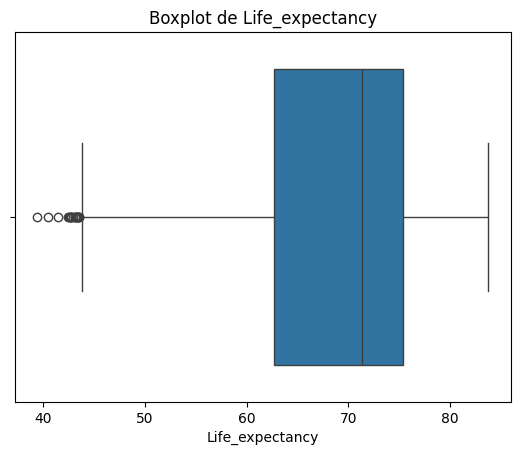

In [12]:
for column in num_columns:
  sns.boxplot(x=dados[column])
  plt.title(f"Boxplot de {column}")
  plt.xlabel(f"{column}")
  plt.show()

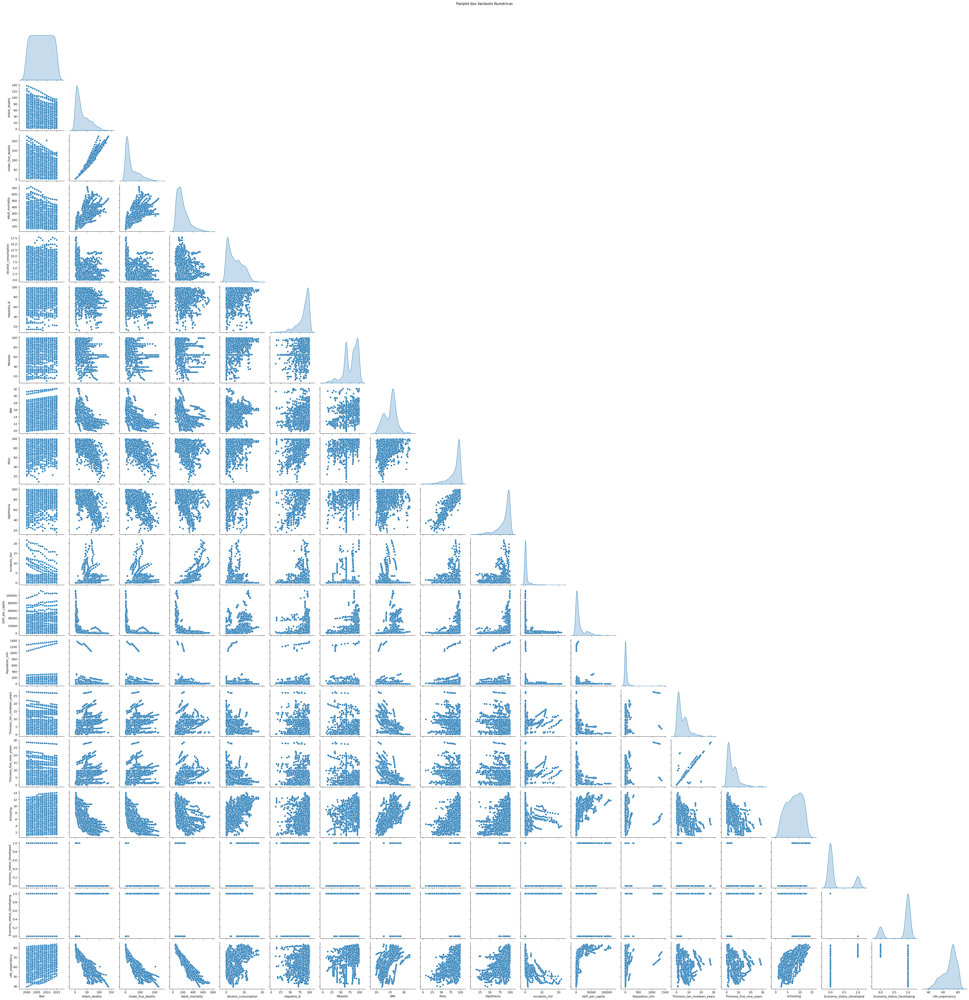

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar as colunas numéricas
num_columns = dados.select_dtypes(include=['float64', 'int64']).columns

# Criar o pairplot
pairplot = sns.pairplot(dados[num_columns], diag_kind='kde', corner=True)

# Ajustar layout
pairplot.fig.suptitle("Pairplot das Variáveis Numéricas", y=1.02)  # Título para o gráfico
plt.show()


In [14]:
num_columns

Index(['Year', 'Infant_deaths', 'Under_five_deaths', 'Adult_mortality',
       'Alcohol_consumption', 'Hepatitis_B', 'Measles', 'BMI', 'Polio',
       'Diphtheria', 'Incidents_HIV', 'GDP_per_capita', 'Population_mln',
       'Thinness_ten_nineteen_years', 'Thinness_five_nine_years', 'Schooling',
       'Economy_status_Developed', 'Economy_status_Developing',
       'Life_expectancy'],
      dtype='object')

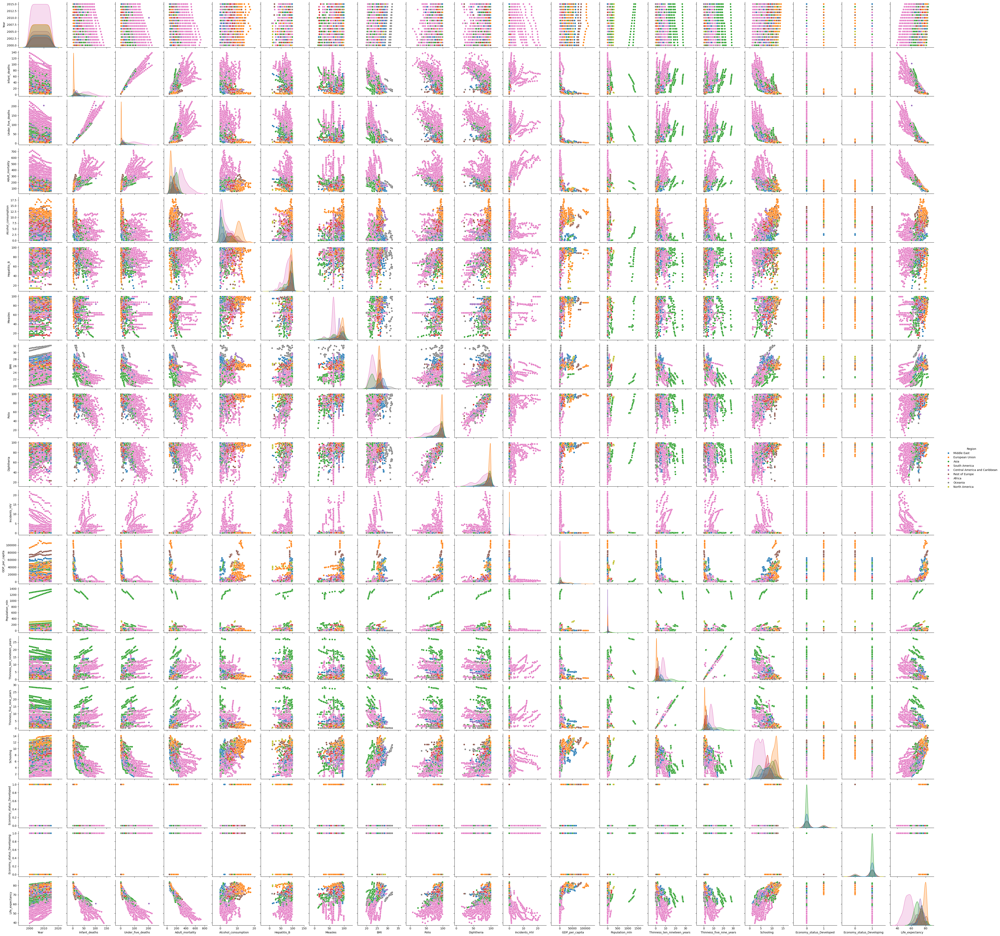

In [15]:
pairplot = sns.pairplot(dados, diag_kind='kde', hue='Region')


### 2.2 Matriz de correlacao

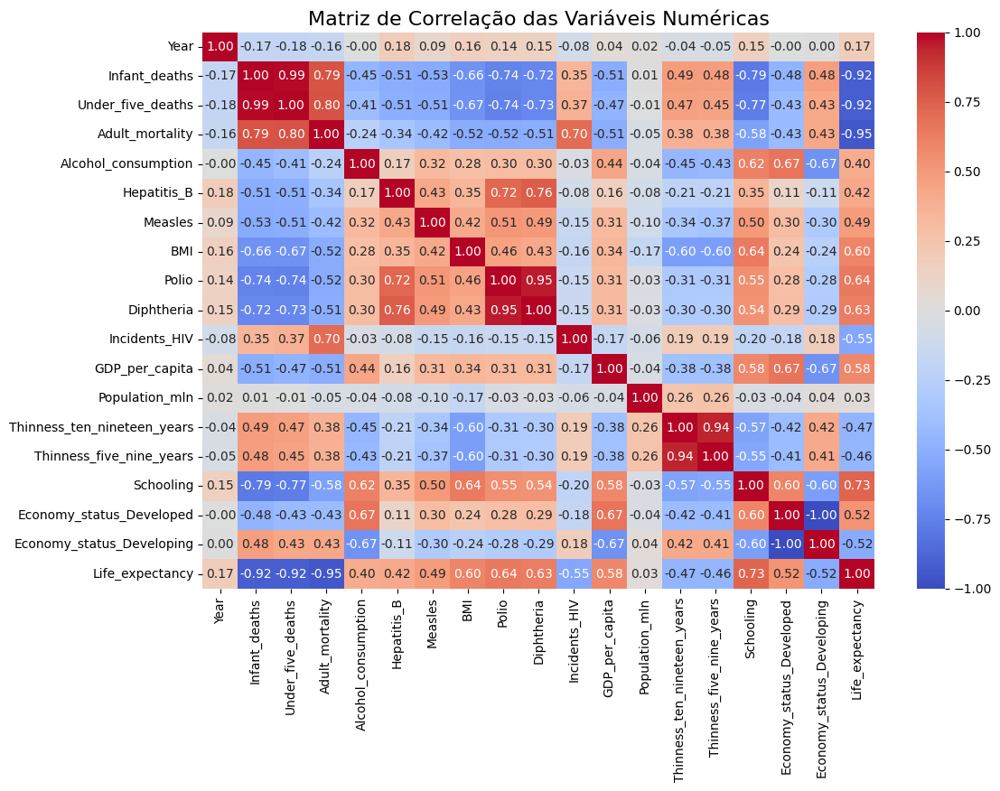

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular a matriz de correlação das variáveis numéricas
correlation_matrix = dados[num_columns].corr()

# Criar o heatmap da matriz de correlação
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Matriz de Correlação das Variáveis Numéricas", fontsize=16)
plt.show()


### 2.3 VIF: Variance Inflation Factor

Critérios de Interpretação do VIF:
* VIF < 5: Baixa colinearidade. Sem preocupações significativas.
* VIF entre 5 e 10: Colinearidade moderada. Pode ser necessário analisar a relevância dessas variáveis.
* VIF > 10: Forte colinearidade. É recomendável revisar a necessidade dessas variáveis no modelo

Para calcular o quanto a variancia de um coeficiente aumenta devido a multicolinearidade.

In [17]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

dados_numericos = dados[num_columns]

dados_numericos = sm.add_constant(dados_numericos)

vif = pd.DataFrame()
vif["Variável"] = dados_numericos.columns
vif["VIF"] = [variance_inflation_factor(dados_numericos.values, i) for i in range(dados_numericos.shape[1])]

vif = vif[vif["Variável"] != "const"]

print(vif)


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                       Variável        VIF
1                          Year   1.078552
2                 Infant_deaths  45.709355
3             Under_five_deaths  48.751498
4               Adult_mortality  24.626360
5           Alcohol_consumption   2.452190
6                   Hepatitis_B   2.626118
7                       Measles   1.589564
8                           BMI   2.792159
9                         Polio  12.020573
10                   Diphtheria  13.001387
11                Incidents_HIV   2.926685
12               GDP_per_capita   2.429123
13               Population_mln   1.152280
14  Thinness_ten_nineteen_years   8.971444
15     Thinness_five_nine_years   8.958778
16                    Schooling   4.477625
17     Economy_status_Developed        inf
18    Economy_status_Developing        inf
19              Life_expectancy  48.340872


### 2.4 Remocao das variaveis redundantes

In [18]:
dados_numericos_sem_redundancia = dados[num_columns].drop(columns=['Under_five_deaths', 'Diphtheria', 'Economy_status_Developing'])
#dados_numericos_sem_redundancia = dados.drop(columns=['Under_five_deaths', 'Diphtheria', 'Economy_status_Developing'])
#num_columns = dados_numericos_sem_redundancia.select_dtypes(include=['int64', 'float64']).columns.tolist()

In [19]:
# add contante
dados_numericos_sem_redundancia = sm.add_constant(dados_numericos_sem_redundancia)

vif = pd.DataFrame()
vif["Variável"] = dados_numericos_sem_redundancia.columns
vif["VIF"] = [variance_inflation_factor(dados_numericos_sem_redundancia.values, i) for i in range(dados_numericos_sem_redundancia.shape[1])]

vif = vif[vif["Variável"] != "const"]

print(vif) #Era p funcionar

                       Variável        VIF
1                          Year   1.076877
2                 Infant_deaths  14.474702
3               Adult_mortality  24.215715
4           Alcohol_consumption   2.422338
5                   Hepatitis_B   2.253139
6                       Measles   1.583660
7                           BMI   2.712999
8                         Polio   3.635969
9                 Incidents_HIV   2.921849
10               GDP_per_capita   2.307339
11               Population_mln   1.150649
12  Thinness_ten_nineteen_years   8.954148
13     Thinness_five_nine_years   8.920233
14                    Schooling   4.383597
15     Economy_status_Developed   2.926751
16              Life_expectancy  44.879132


COmo:
12  Thinness_ten_nineteen_years   8.954148
13     Thinness_five_nine_years   8.920233
possuem valores muito proximo juntarei as duas para criar uma faixa etaria maior e diminuir a redundancia.

In [20]:
dados_numericos_sem_redundancia["Thinness_avg"] = dados_numericos_sem_redundancia[["Thinness_ten_nineteen_years", "Thinness_five_nine_years"]].mean(axis=1)

In [21]:
dados_numericos_sem_redundancia[["Thinness_avg","Thinness_ten_nineteen_years", "Thinness_five_nine_years"]].head(1)

,Thinness_avg,Thinness_ten_nineteen_years,Thinness_five_nine_years
0,4.85,4.9,4.8


In [22]:
dados_numericos_sem_redundancia = dados_numericos_sem_redundancia.drop(columns=["Thinness_ten_nineteen_years", "Thinness_five_nine_years"])

In [23]:
correlacoes = dados_numericos_sem_redundancia.corr()
print(correlacoes["Life_expectancy"].sort_values(ascending=False))

Life_expectancy             1.000000
Schooling                   0.732484
Polio                       0.641217
BMI                         0.598423
GDP_per_capita              0.583090
Economy_status_Developed    0.523791
Measles                     0.490019
Hepatitis_B                 0.417804
Alcohol_consumption         0.399159
Year                        0.174359
Population_mln              0.026298
Thinness_avg               -0.470203
Incidents_HIV              -0.553027
Infant_deaths              -0.920032
Adult_mortality            -0.945360
const                            NaN
Name: Life_expectancy, dtype: float64


In [24]:
dados_numericos_sem_redundancia_sem_adulto = dados_numericos_sem_redundancia.drop(columns='Adult_mortality')
#dados_numericos_sem_redundancia_sem_infantil = dados_numericos_sem_redundancia.drop(columns='Infant_deaths')

In [25]:
dados_numericos_sem_redundancia_sem_adulto = dados_numericos_sem_redundancia.drop(columns='Adult_mortality')


In [26]:
dados_numericos_sem_redundancia_sem_adulto

,const,Year,Infant_deaths,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Incidents_HIV,GDP_per_capita,Population_mln,Schooling,Economy_status_Developed,Life_expectancy,Thinness_avg
0,1.0,2015,11.1,1.320,97,65,27.8,97,0.08,11006,78.53,7.8,0,76.5,4.85
1,1.0,2015,2.7,10.350,97,94,26.0,97,0.09,25742,46.44,9.7,1,82.8,0.55
2,1.0,2007,51.5,1.570,60,35,21.2,67,0.13,1076,1183.21,5.0,0,65.4,27.55
3,1.0,2006,32.8,5.680,93,74,25.3,92,0.79,4146,0.75,7.9,0,67.0,5.60
4,1.0,2012,3.4,2.890,97,89,27.0,94,0.08,33995,7.91,12.8,1,81.7,1.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2859,1.0,2000,97.0,0.092,72,64,20.8,41,0.49,399,11.33,1.1,0,49.9,12.85
2860,1.0,2009,23.9,6.560,97,97,25.3,96,0.02,2515,2.67,9.1,0,66.9,2.25
2861,1.0,2004,17.7,1.560,62,95,21.9,97,0.02,2130,19.39,10.3,0,74.3,15.45
2862,1.0,2002,7.9,11.000,94,95,26.1,97,0.05,7424,3.44,11.1,1,71.8,3.30


In [27]:
dados['Region'].unique()


array(['Middle East', 'European Union', 'Asia', 'South America',
       'Central America and Caribbean', 'Rest of Europe', 'Africa',
       'Oceania', 'North America'], dtype=object)

In [28]:
dados

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.8240,1.320,97,65,27.8,...,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5
1,Spain,European Union,2015,2.7,3.3,57.9025,10.350,97,94,26.0,...,97,0.09,25742,46.44,0.6,0.5,9.7,1,0,82.8
2,India,Asia,2007,51.5,67.9,201.0765,1.570,60,35,21.2,...,64,0.13,1076,1183.21,27.1,28.0,5.0,0,1,65.4
3,Guyana,South America,2006,32.8,40.5,222.1965,5.680,93,74,25.3,...,93,0.79,4146,0.75,5.7,5.5,7.9,0,1,67.0
4,Israel,Middle East,2012,3.4,4.3,57.9510,2.890,97,89,27.0,...,94,0.08,33995,7.91,1.2,1.1,12.8,1,0,81.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2859,Niger,Africa,2000,97.0,224.9,291.8240,0.092,72,64,20.8,...,34,0.49,399,11.33,12.8,12.9,1.1,0,1,49.9
2860,Mongolia,Asia,2009,23.9,28.6,235.2330,6.560,97,97,25.3,...,95,0.02,2515,2.67,2.2,2.3,9.1,0,1,66.9
2861,Sri Lanka,Asia,2004,17.7,28.9,134.8950,1.560,62,95,21.9,...,97,0.02,2130,19.39,15.4,15.5,10.3,0,1,74.3
2862,Lithuania,European Union,2002,7.9,9.9,204.0120,11.000,94,95,26.1,...,95,0.05,7424,3.44,3.3,3.3,11.1,1,0,71.8


In [29]:
dados_categoricos

,Country_Albania,Country_Algeria,Country_Angola,Country_Antigua and Barbuda,Country_Argentina,Country_Armenia,Country_Australia,Country_Austria,Country_Azerbaijan,"Country_Bahamas, The",...,Country_Zambia,Country_Zimbabwe,Region_Asia,Region_Central America and Caribbean,Region_European Union,Region_Middle East,Region_North America,Region_Oceania,Region_Rest of Europe,Region_South America
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2859,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2860,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
2861,False,False,False,False,False,False,False,False,False,False,...,False,False,True,False,False,False,False,False,False,False
2862,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False


In [30]:
t =pd.concat([dados_numericos_sem_redundancia_sem_adulto, dados_categoricos], axis=1)
t

,const,Year,Infant_deaths,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Incidents_HIV,GDP_per_capita,...,Country_Zambia,Country_Zimbabwe,Region_Asia,Region_Central America and Caribbean,Region_European Union,Region_Middle East,Region_North America,Region_Oceania,Region_Rest of Europe,Region_South America
0,1.0,2015,11.1,1.320,97,65,27.8,97,0.08,11006,...,False,False,False,False,False,True,False,False,False,False
1,1.0,2015,2.7,10.350,97,94,26.0,97,0.09,25742,...,False,False,False,False,True,False,False,False,False,False
2,1.0,2007,51.5,1.570,60,35,21.2,67,0.13,1076,...,False,False,True,False,False,False,False,False,False,False
3,1.0,2006,32.8,5.680,93,74,25.3,92,0.79,4146,...,False,False,False,False,False,False,False,False,False,True
4,1.0,2012,3.4,2.890,97,89,27.0,94,0.08,33995,...,False,False,False,False,False,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2859,1.0,2000,97.0,0.092,72,64,20.8,41,0.49,399,...,False,False,False,False,False,False,False,False,False,False
2860,1.0,2009,23.9,6.560,97,97,25.3,96,0.02,2515,...,False,False,True,False,False,False,False,False,False,False
2861,1.0,2004,17.7,1.560,62,95,21.9,97,0.02,2130,...,False,False,True,False,False,False,False,False,False,False
2862,1.0,2002,7.9,11.000,94,95,26.1,97,0.05,7424,...,False,False,False,False,True,False,False,False,False,False


In [31]:
pip install category-encoders


In [32]:
from category_encoders import TargetEncoder
from sklearn.model_selection import KFold
import pandas as pd

# Dados categóricos e variável alvo
categorias = ["Country", "Region"]
y = dados["Life_expectancy"]

# Criar o Target Encoder
target_encoder = TargetEncoder(cols=categorias)

# Aplicar Target Encoding com validação cruzada para evitar vazamento de dados
kf = KFold(n_splits=5, shuffle=True, random_state=42)
dados_encoded = dados.copy()

for train_idx, test_idx in kf.split(dados):
    dados_train, dados_test = dados.iloc[train_idx], dados.iloc[test_idx]
    target_encoder.fit(dados_train[categorias], dados_train["Life_expectancy"])
    dados_encoded.loc[test_idx, categorias] = target_encoder.transform(dados_test[categorias])

# Verificar o resultado
print(dados_encoded[categorias].head())


     Country     Region
0  70.449458  73.800571
1  72.956342   77.49621
2   67.82169  69.410204
3  68.375071  72.763503
4  72.772569  73.916577


In [33]:
dados_encoded.columns

Index(['Country', 'Region', 'Year', 'Infant_deaths', 'Under_five_deaths',
       'Adult_mortality', 'Alcohol_consumption', 'Hepatitis_B', 'Measles',
       'BMI', 'Polio', 'Diphtheria', 'Incidents_HIV', 'GDP_per_capita',
       'Population_mln', 'Thinness_ten_nineteen_years',
       'Thinness_five_nine_years', 'Schooling', 'Economy_status_Developed',
       'Economy_status_Developing', 'Life_expectancy'],
      dtype='object')

In [34]:
dados_encoded["Thinness_avg"] = dados_encoded[["Thinness_ten_nineteen_years", "Thinness_five_nine_years"]].mean(axis=1)
dados_encoded_limpos = dados_encoded.drop(columns=["Thinness_ten_nineteen_years", "Thinness_five_nine_years", "Adult_mortality", 'Under_five_deaths', 'Diphtheria', 'Economy_status_Developing'])

In [35]:
dados_encoded_limpos.columns

Index(['Country', 'Region', 'Year', 'Infant_deaths', 'Alcohol_consumption',
       'Hepatitis_B', 'Measles', 'BMI', 'Polio', 'Incidents_HIV',
       'GDP_per_capita', 'Population_mln', 'Schooling',
       'Economy_status_Developed', 'Life_expectancy', 'Thinness_avg'],
      dtype='object')

In [36]:
print(dados_encoded_limpos.isnull().sum())


Country                     0
Region                      0
Year                        0
Infant_deaths               0
Alcohol_consumption         0
Hepatitis_B                 0
Measles                     0
BMI                         0
Polio                       0
Incidents_HIV               0
GDP_per_capita              0
Population_mln              0
Schooling                   0
Economy_status_Developed    0
Life_expectancy             0
Thinness_avg                0
dtype: int64


In [37]:
print(dados_encoded_limpos.dtypes)


Country                      object
Region                       object
Year                          int64
Infant_deaths               float64
Alcohol_consumption         float64
Hepatitis_B                   int64
Measles                       int64
BMI                         float64
Polio                         int64
Incidents_HIV               float64
GDP_per_capita                int64
Population_mln              float64
Schooling                   float64
Economy_status_Developed      int64
Life_expectancy             float64
Thinness_avg                float64
dtype: object


In [38]:
#dados_numericos3[['Country', 'Region']].head(1)
dados_encoded_limpos['Country'] = pd.to_numeric(dados_encoded_limpos['Country'], errors='coerce')
dados_encoded_limpos['Region'] = pd.to_numeric(dados_encoded_limpos['Region'], errors='coerce')
#print(dados_numericos3.isnull().sum())
print(dados_encoded_limpos.dtypes)


Country                     float64
Region                      float64
Year                          int64
Infant_deaths               float64
Alcohol_consumption         float64
Hepatitis_B                   int64
Measles                       int64
BMI                         float64
Polio                         int64
Incidents_HIV               float64
GDP_per_capita                int64
Population_mln              float64
Schooling                   float64
Economy_status_Developed      int64
Life_expectancy             float64
Thinness_avg                float64
dtype: object


In [39]:
#import numpy as np
#assert np.isfinite(dados_numericos3.values).all(), "Existem valores infinitos no dataframe!"


In [40]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

dados_numericos3 = dados_encoded_limpos

dados_numericos3 = sm.add_constant(dados_numericos3)

vif = pd.DataFrame()
vif["Variável"] = dados_numericos3.columns
vif["VIF"] = [variance_inflation_factor(dados_numericos3.values, i) for i in range(dados_numericos3.shape[1])]

vif = vif[vif["Variável"] != "const"]

print(vif)


                    Variável        VIF
1                    Country  29.257327
2                     Region   3.531710
3                       Year   2.127065
4              Infant_deaths  13.081582
5        Alcohol_consumption   2.362008
6                Hepatitis_B   2.257923
7                    Measles   1.570558
8                        BMI   2.707993
9                      Polio   3.665066
10             Incidents_HIV   2.273268
11            GDP_per_capita   2.352057
12            Population_mln   1.146971
13                 Schooling   4.319479
14  Economy_status_Developed   2.985785
15           Life_expectancy  41.003541
16              Thinness_avg   2.069889


com um vif de 29 Country sera removido

In [41]:
dados_encoded_limpos = dados_encoded_limpos.drop(columns='Country')

In [42]:
dados_encoded_limpos.head()

,Region,Year,Infant_deaths,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Incidents_HIV,GDP_per_capita,Population_mln,Schooling,Economy_status_Developed,Life_expectancy,Thinness_avg
0,73.800571,2015,11.1,1.32,97,65,27.8,97,0.08,11006,78.53,7.8,0,76.5,4.85
1,77.496210,2015,2.7,10.35,97,94,26.0,97,0.09,25742,46.44,9.7,1,82.8,0.55
2,69.410204,2007,51.5,1.57,60,35,21.2,67,0.13,1076,1183.21,5.0,0,65.4,27.55
3,72.763503,2006,32.8,5.68,93,74,25.3,92,0.79,4146,0.75,7.9,0,67.0,5.60
4,73.916577,2012,3.4,2.89,97,89,27.0,94,0.08,33995,7.91,12.8,1,81.7,1.15


## 4. Modelagem

In [44]:
X = dados_encoded_limpos.drop(columns='Life_expectancy')
y = dados_encoded_limpos['Life_expectancy']

In [45]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42, shuffle=True)

In [46]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [52]:
from sklearn.linear_model import LinearRegression
modelo = LinearRegression()
modelo.fit(X_train_scaled, y_train)
y_pred = modelo.predict(X_test_scaled)

In [56]:
from sklearn.metrics import root_mean_squared_error, r2_score

rmse = root_mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"RMSE: {rmse:.2f}")
print(f"R**2: {r2:.2f}")

RMSE: 2.48
R**2: 0.93
